# IMPORTS

In [31]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torchvision import transforms, datasets
from torch.utils.data import DataLoader, Dataset, Subset, random_split
from PIL import Image
from torch import autograd
from torchvision.transforms import ToTensor, ToPILImage
from torchvision.datasets import ImageFolder
from torchvision.transforms import ToTensor
from torch.autograd import Variable
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from torch.utils.data import SubsetRandomSampler
import os
from sklearn.model_selection import train_test_split
from torchvision.io import read_image

In [32]:
'cuda' if torch.cuda.is_available() else 'cpu'

'cuda'

In [33]:
torch.cuda.is_available()


True

# EDA

In [34]:
data='Shoes-Dataset-Gray-Scaled'

In [35]:
def visualize_images(path):
    image_filenames = os.listdir(path)
    num_images = min(20, len(image_filenames))
    num_rows = num_images // 5 + (1 if num_images % 5 else 0)
    fig, axes = plt.subplots(num_rows, 5, figsize=(15, 3 * num_rows), facecolor='white')
    axes = axes.flatten() if num_rows > 1 else [axes]
    
    for i, image_filename in enumerate(image_filenames[:num_images]):
        image_path = os.path.join(path, image_filename)
        image = mpimg.imread(image_path)
        if len(image.shape) == 3 and image.shape[2] == 3:  
            image = image.mean(axis=2) 
        axes[i].imshow(image, cmap='gray')
        axes[i].set_title(image_filename, fontsize=8)


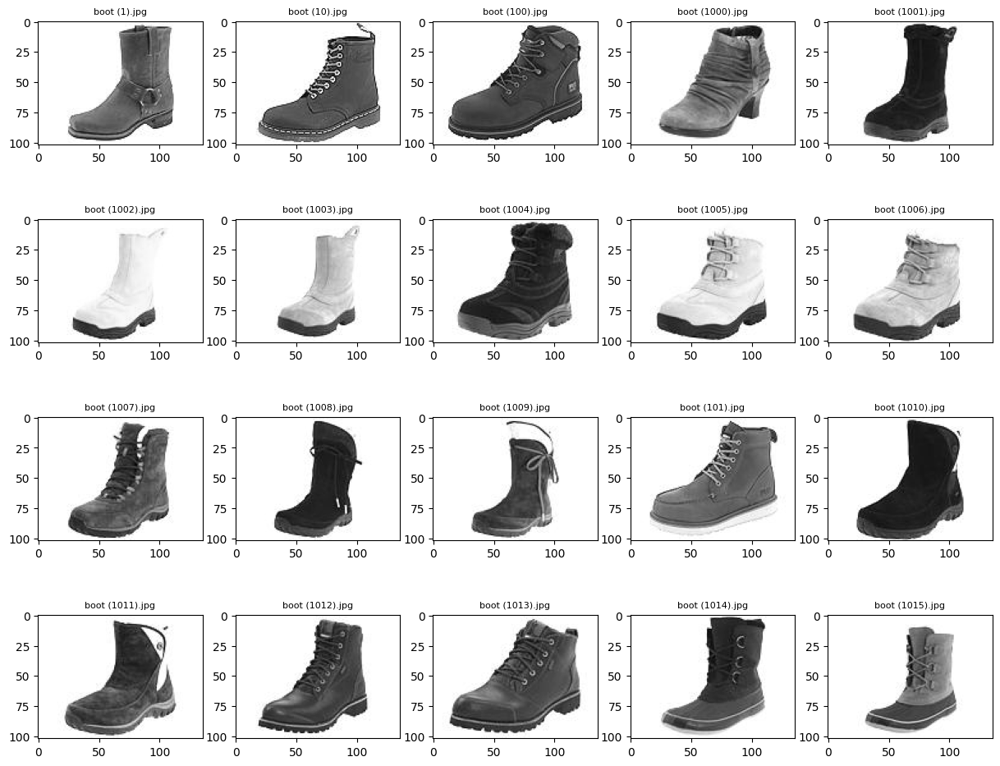

In [36]:
Boot_Dir = 'C:\\Users\\ahksa.LAPTOP-394KBUA4\\OneDrive\\Desktop\\CESS Files\\Semester 6\\Artificial Intelligence\\Project\\Image-Generation-Using-Generative-AI\\GANs-Gray-Scaled\\Shoes-Dataset-Gray-Scaled\\Boot'
visualize_images(Boot_Dir)

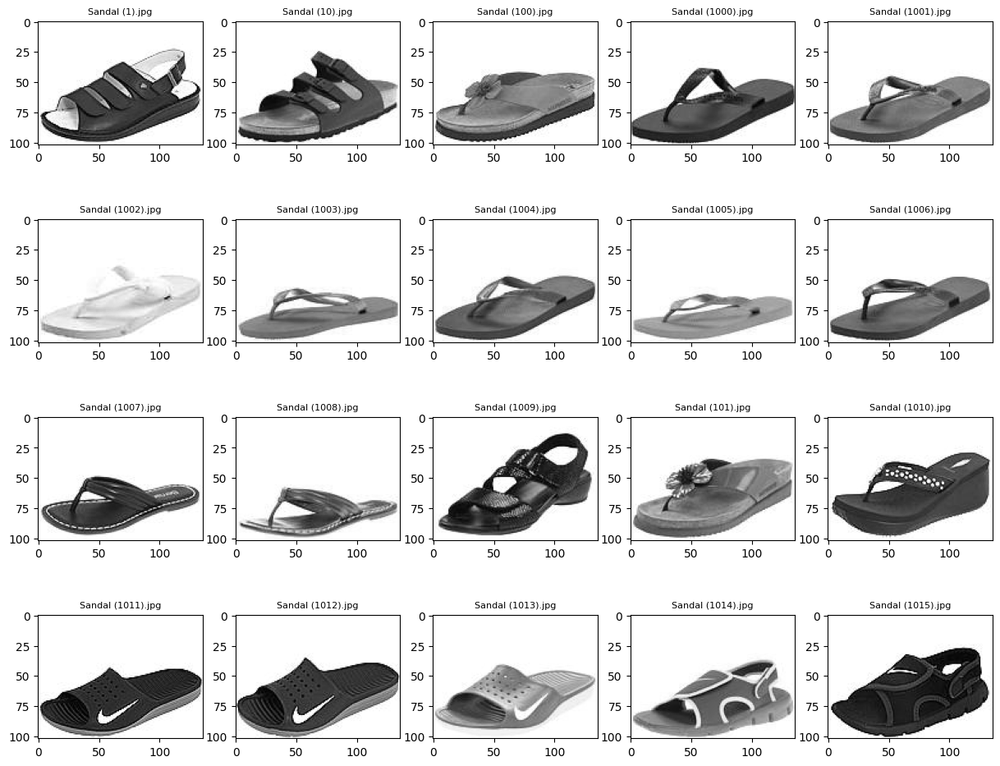

In [37]:
Sandal_Dir = 'C:\\Users\\ahksa.LAPTOP-394KBUA4\\OneDrive\\Desktop\\CESS Files\\Semester 6\\Artificial Intelligence\\Project\\Image-Generation-Using-Generative-AI\\GANs-Gray-Scaled\\Shoes-Dataset-Gray-Scaled\\Sandal'
visualize_images(Sandal_Dir)

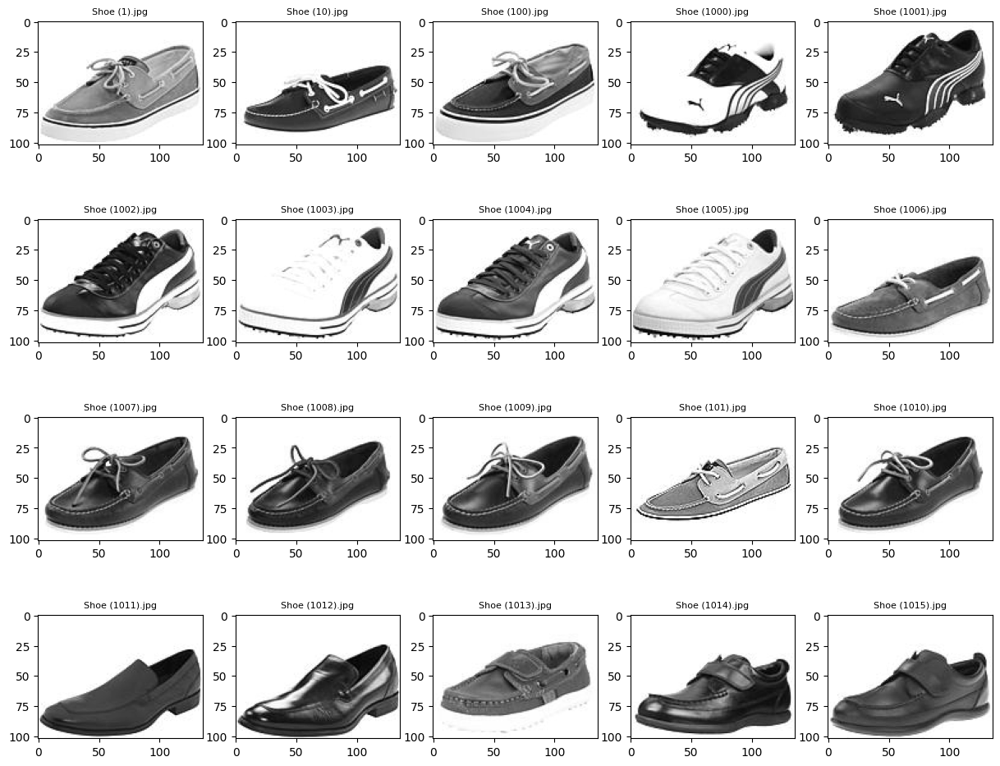

In [38]:
Shoe_Dir = 'C:\\Users\\ahksa.LAPTOP-394KBUA4\\OneDrive\\Desktop\\CESS Files\\Semester 6\\Artificial Intelligence\\Project\\Image-Generation-Using-Generative-AI\\GANs-Gray-Scaled\\Shoes-Dataset-Gray-Scaled\\Shoe'
visualize_images(Shoe_Dir)

In [39]:
img = Image.open(os.path.join(Boot_Dir, os.listdir(Boot_Dir)[0]))
img = np.array(img)
img.shape

(102, 136)

In [40]:
img = Image.open(os.path.join(Sandal_Dir, os.listdir(Sandal_Dir)[0]))
img = np.array(img)
img.shape

(102, 136)

In [41]:
img = Image.open(os.path.join(Shoe_Dir, os.listdir(Shoe_Dir)[0]))
img = np.array(img)
img.shape

(102, 136)

# Dataset and Dataloader

In [42]:
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
#    transforms.Normalize([0.5], [0.5])
])

In [43]:
Foot_Dataset = datasets.ImageFolder(data, transform=transform)
classes = Foot_Dataset.classes
print(classes)

['Boot', 'Sandal', 'Shoe']


In [44]:
Foot_Dataset

Dataset ImageFolder
    Number of datapoints: 15000
    Root location: Shoes-Dataset-Gray-Scaled
    StandardTransform
Transform: Compose(
               RandomHorizontalFlip(p=0.5)
               Grayscale(num_output_channels=1)
               Resize(size=(128, 128), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
           )

In [45]:
Foot_Dataset.__len__()

15000

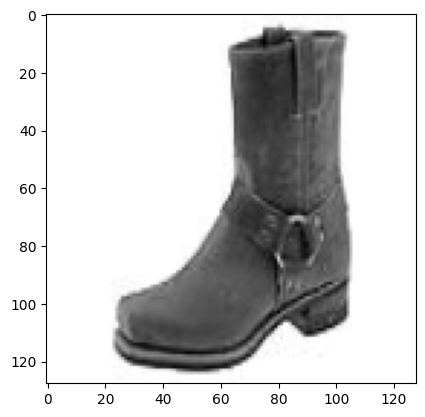

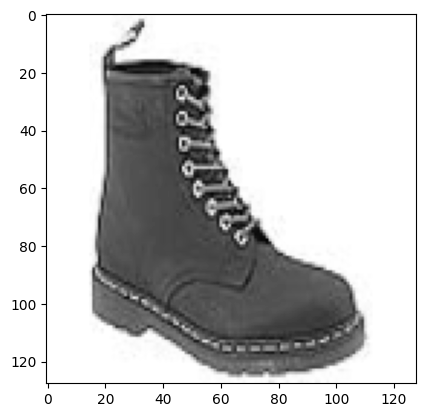

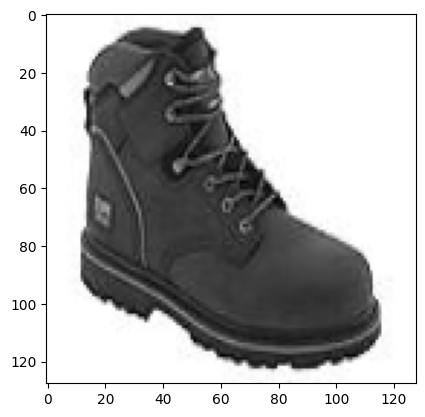

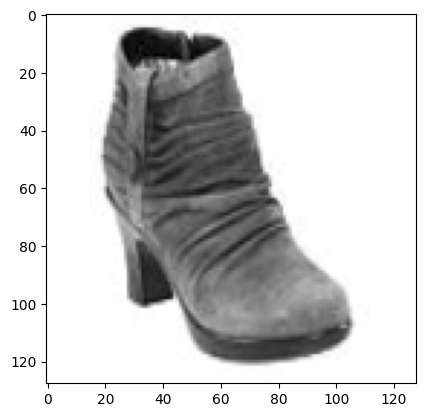

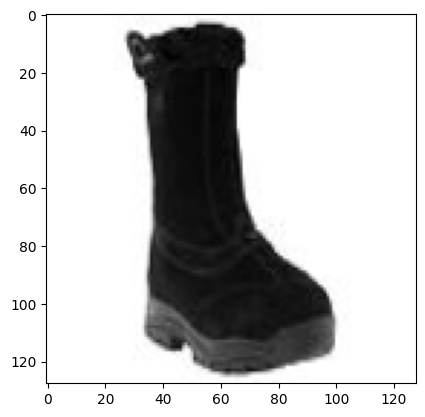

In [46]:
for i in range(5):
    plt.imshow(Foot_Dataset[i][0].permute(1, 2, 0).cpu().numpy(), cmap='gray')
    plt.show()

In [47]:
train_size = int(0.8 * len(Foot_Dataset))
valid_size = len(Foot_Dataset) - train_size
train_ds, valid_ds = random_split(Foot_Dataset, [train_size, valid_size])

In [48]:
print("This is the size of Train Dataset:",train_ds.__len__())
print("This is the size of Validation Dataset:",valid_ds.__len__())

This is the size of Train Dataset: 12000
This is the size of Validation Dataset: 3000


In [49]:
print("This is the shape of Train Dataset:",train_ds[0][0].shape)
print("This is the shape of Train Dataset:",valid_ds[0][0].shape)

if  train_ds[0][0].shape == valid_ds[0][0].shape:
    print("\nTHEY ARE THE SAME SHAPE")

This is the shape of Train Dataset: torch.Size([1, 128, 128])
This is the shape of Train Dataset: torch.Size([1, 128, 128])

THEY ARE THE SAME SHAPE


# MODEL

In [50]:
batch_size=256

train_loader = DataLoader(train_ds, batch_size, shuffle=True)
valid_loader = DataLoader(valid_ds, batch_size, shuffle=True)

In [51]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Linear(16384, 2048),  # Input size to match 128x128 image
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(2048, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = x.view(-1, 16384)  # Flatten the image
        return self.disc(x)


In [52]:
class Generator(nn.Module):
    def __init__(self, z_dim):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            nn.Linear(z_dim, 512),
            nn.ReLU(True),
            nn.Linear(512, 1024),
            nn.ReLU(True),
            nn.Linear(1024, 2048),
            nn.ReLU(True),
            nn.Linear(2048, 16384),  # Output size to match 128x128 image
            nn.Tanh()
        )

    def forward(self, x):
        return self.gen(x).view(-1, 1, 128, 128)  # Reshape to N x 1 x 128 x 128


In [53]:
z_dim = 64
gen = Generator(z_dim)
gen

Generator(
  (gen): Sequential(
    (0): Linear(in_features=64, out_features=512, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=512, out_features=1024, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=1024, out_features=2048, bias=True)
    (5): ReLU(inplace=True)
    (6): Linear(in_features=2048, out_features=16384, bias=True)
    (7): Tanh()
  )
)

In [54]:
disc = Discriminator()
disc

Discriminator(
  (disc): Sequential(
    (0): Linear(in_features=16384, out_features=2048, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Linear(in_features=2048, out_features=1024, bias=True)
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Linear(in_features=1024, out_features=512, bias=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Linear(in_features=512, out_features=1, bias=True)
    (7): Sigmoid()
  )
)

In [55]:
device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")

In [56]:
criterion = nn.BCELoss()
n_epochs = 500
z_dim = 64
display_step = 500
lr = 0.0002

In [57]:
gen = gen.to(device)
disc = disc.to(device)
criterion = criterion.to(device)

gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(0.5, 0.999))
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr, betas=(0.5, 0.999))

In [58]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    return disc_loss

def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    return gen_loss

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def get_noise(n_samples, z_dim, device='cuda'):
    return torch.randn(n_samples, z_dim, device=device)


In [1]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True
gen_loss = False
error = False
generator_losses = []
discriminator_losses = []


Epoch [10/500] Step 500: Generator loss: 0.8072182749137276, Discriminator loss: 0.648280066430569


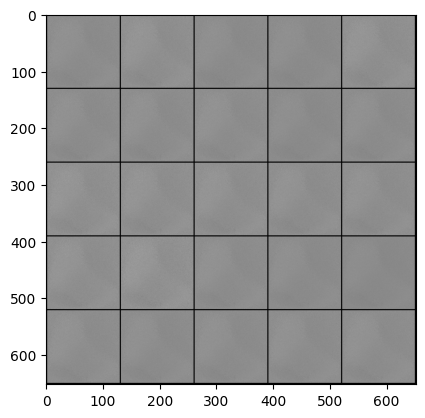

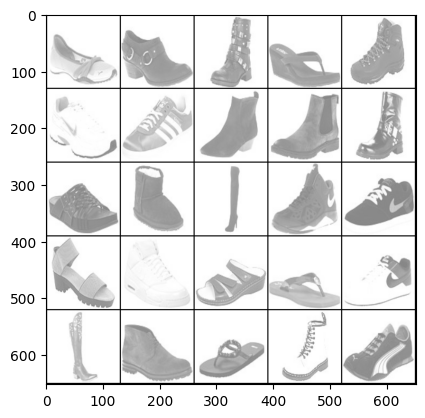

Epoch [21/500] Step 1000: Generator loss: 1.0240847115516658, Discriminator loss: 0.6452584522962569


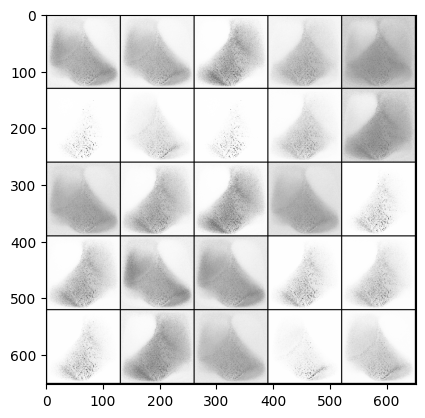

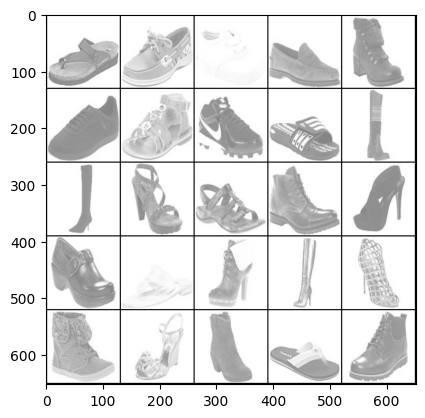

Epoch [31/500] Step 1500: Generator loss: 0.9615667222142232, Discriminator loss: 0.6234772835373878


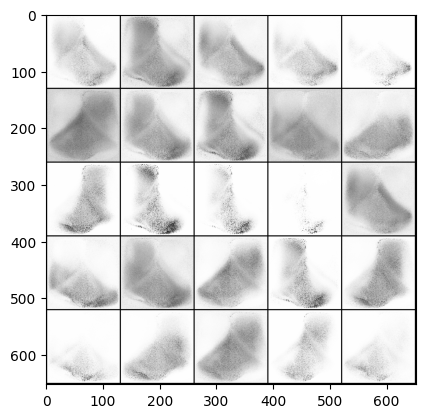

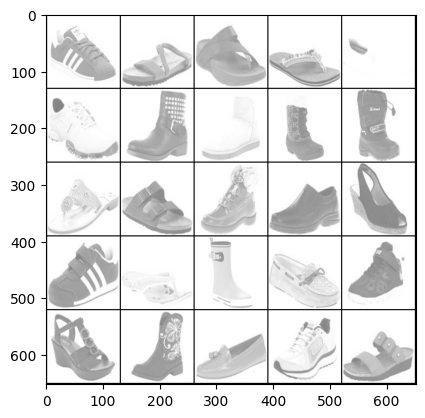

Epoch [42/500] Step 2000: Generator loss: 0.8884253462553037, Discriminator loss: 0.6612566778659819


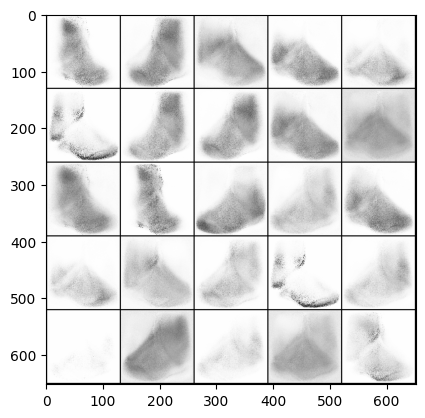

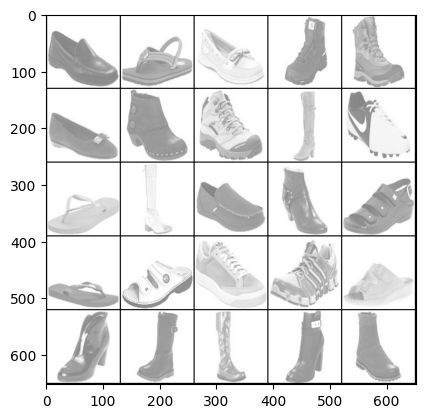

Epoch [53/500] Step 2500: Generator loss: 0.8825002349019044, Discriminator loss: 0.6554013729095456


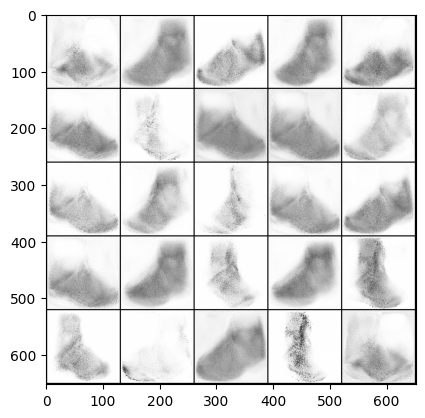

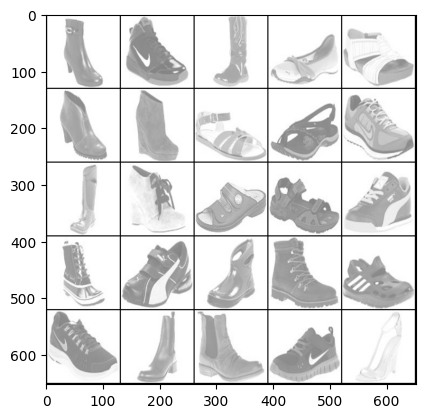

Epoch [63/500] Step 3000: Generator loss: 0.8704589119553564, Discriminator loss: 0.6601462547779083


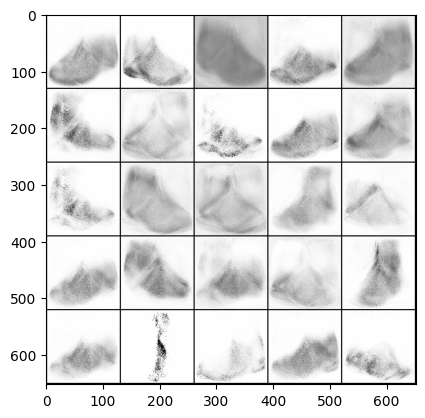

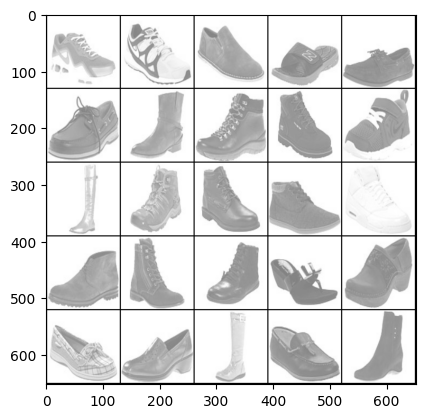

Epoch [74/500] Step 3500: Generator loss: 0.873072100937367, Discriminator loss: 0.6603140547275537


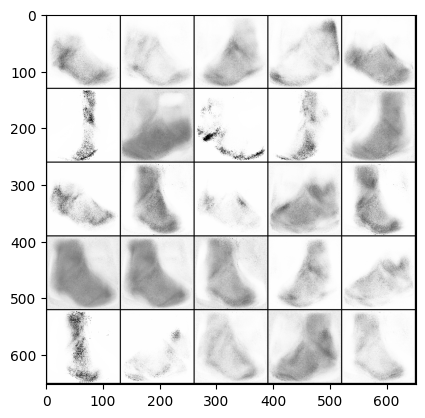

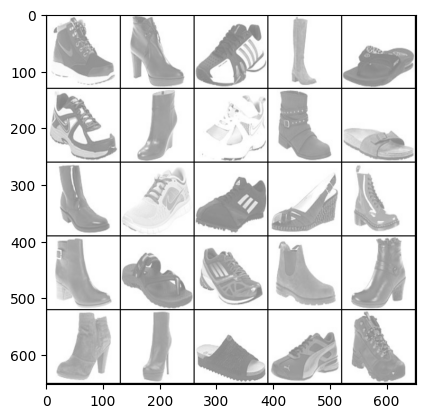

Epoch [85/500] Step 4000: Generator loss: 0.8695075231790542, Discriminator loss: 0.6534470306634897


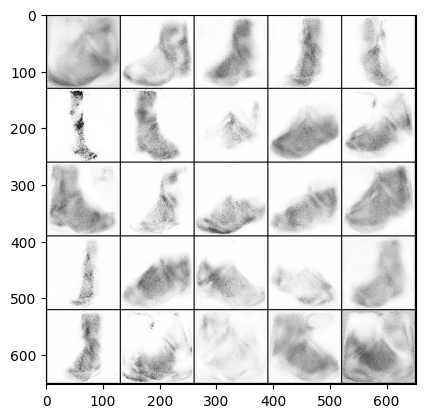

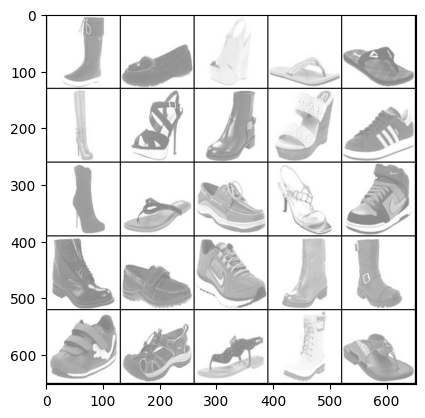

Epoch [95/500] Step 4500: Generator loss: 0.8680531713366512, Discriminator loss: 0.6572351264953609


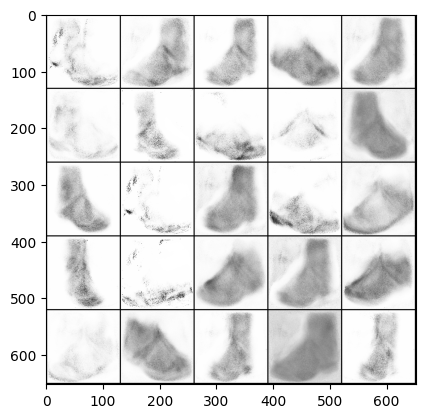

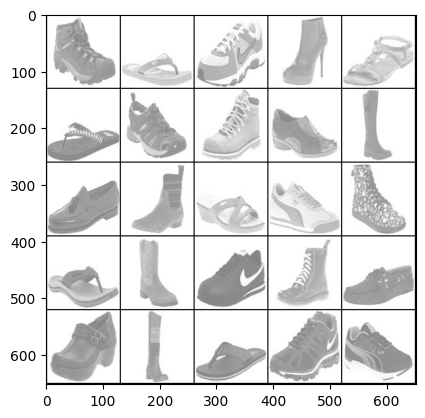

Epoch [106/500] Step 5000: Generator loss: 0.8663494050502785, Discriminator loss: 0.6574657220840453


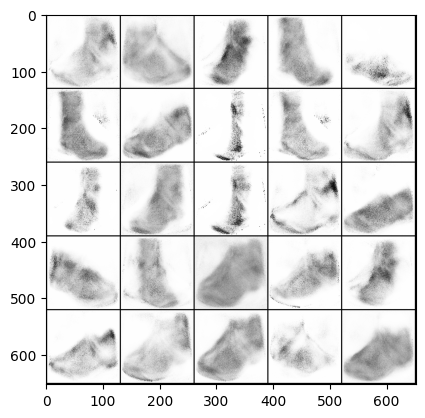

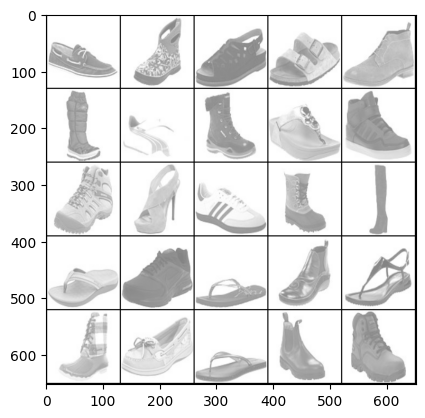

Epoch [117/500] Step 5500: Generator loss: 0.868627545356751, Discriminator loss: 0.6555413283109668


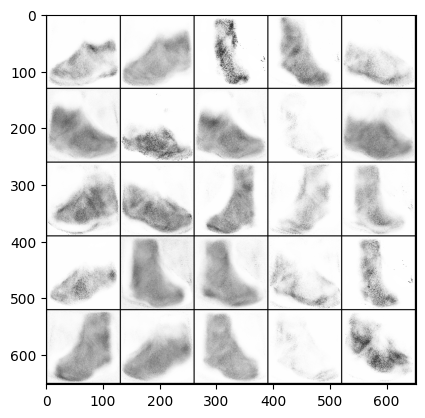

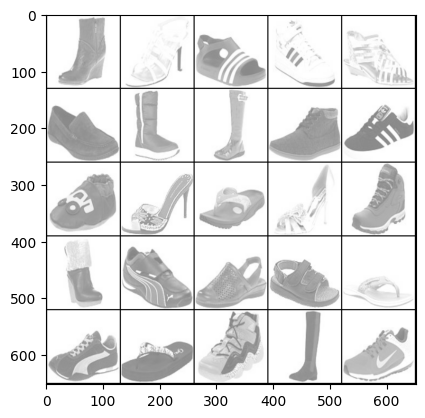

Epoch [127/500] Step 6000: Generator loss: 0.8759098677635202, Discriminator loss: 0.6530701993703844


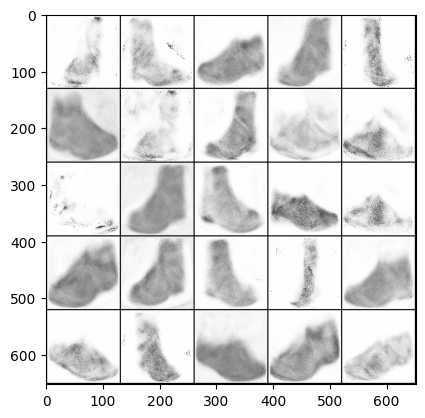

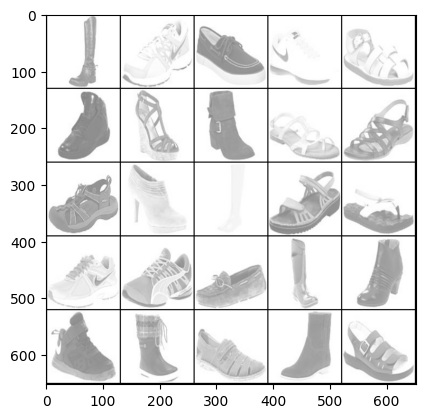

Epoch [138/500] Step 6500: Generator loss: 0.8689356558322912, Discriminator loss: 0.6561978906393051


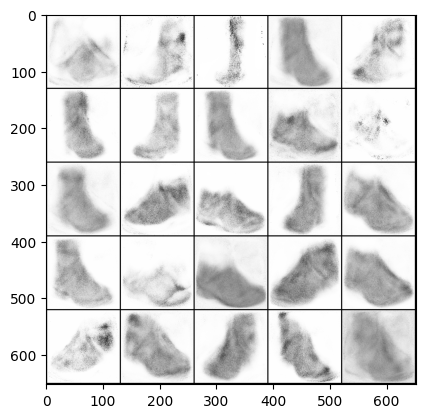

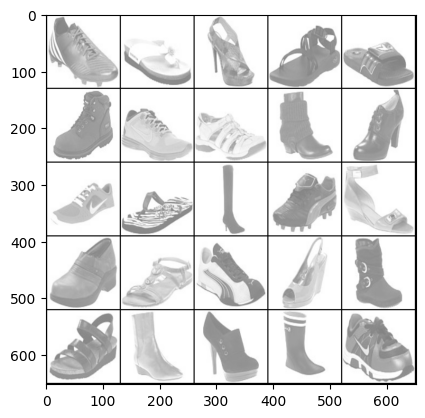

Epoch [148/500] Step 7000: Generator loss: 0.8680509165525438, Discriminator loss: 0.652522473454475


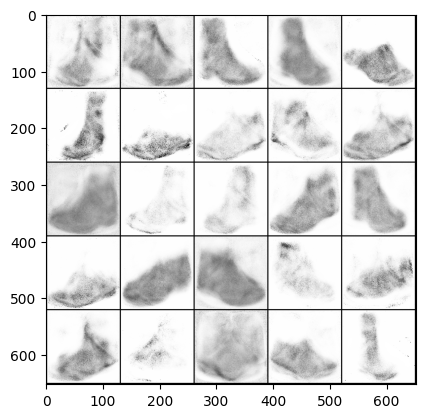

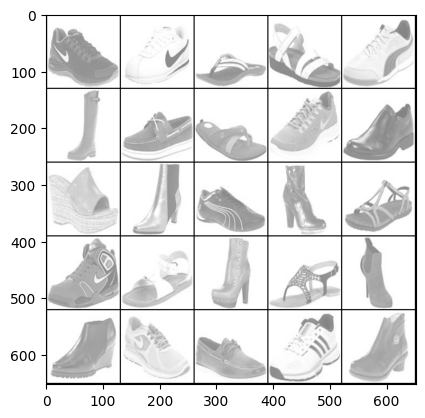

Epoch [159/500] Step 7500: Generator loss: 0.8720522891283027, Discriminator loss: 0.6532680499553679


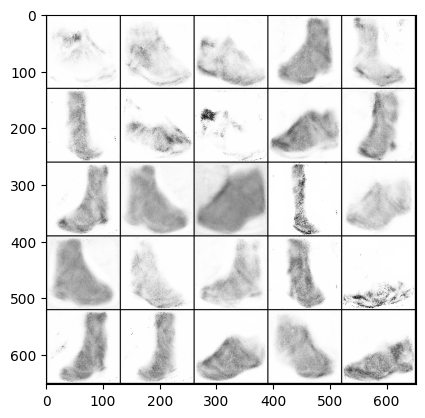

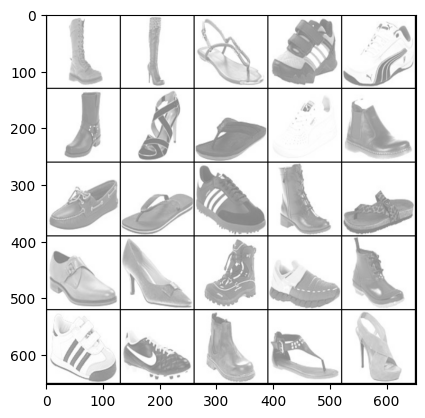

Epoch [170/500] Step 8000: Generator loss: 0.8697669199109085, Discriminator loss: 0.6548231858015063


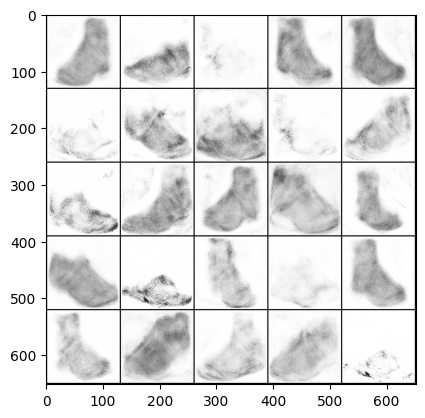

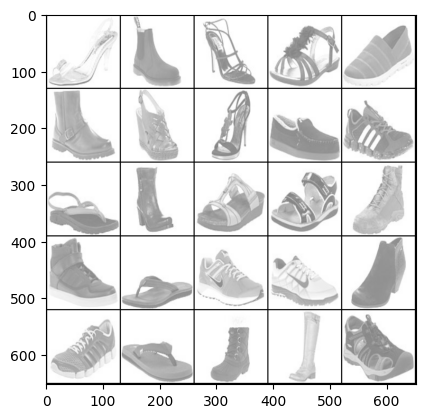

Epoch [180/500] Step 8500: Generator loss: 0.8704340753555294, Discriminator loss: 0.6564429609775551


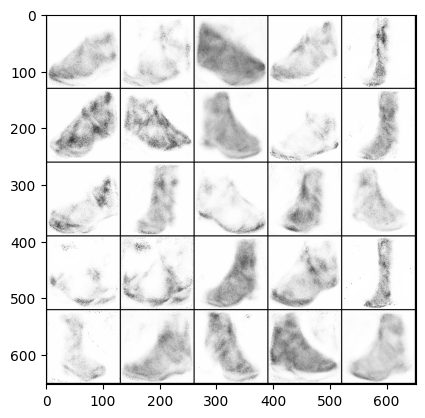

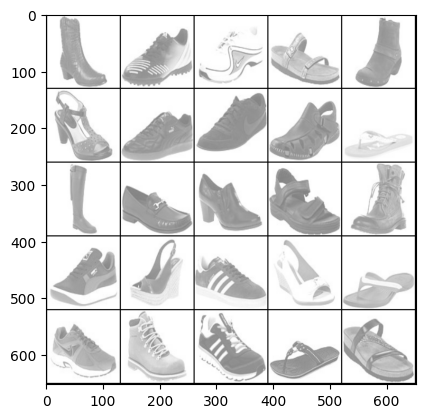

Epoch [191/500] Step 9000: Generator loss: 0.8560756957530972, Discriminator loss: 0.6576490781307227


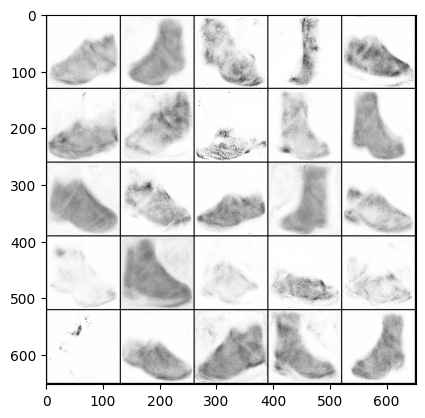

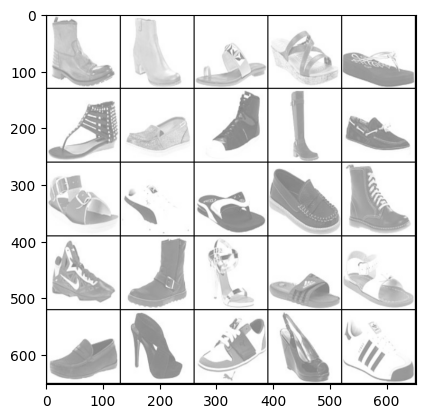

Epoch [202/500] Step 9500: Generator loss: 0.8559655169248583, Discriminator loss: 0.6574195947647103


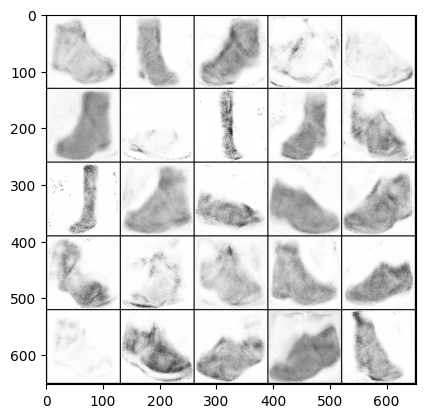

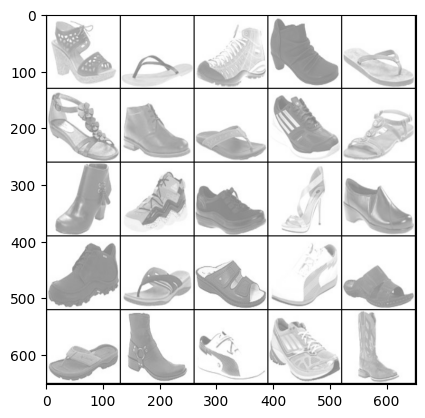

Epoch [212/500] Step 10000: Generator loss: 0.8507350785136224, Discriminator loss: 0.6582649703025819


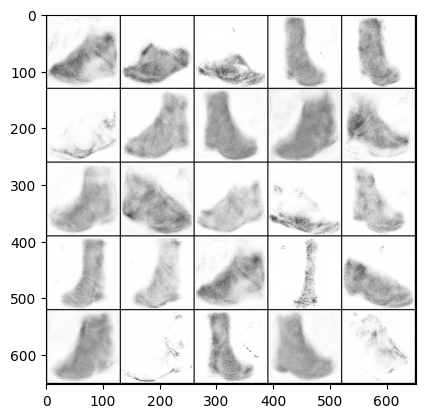

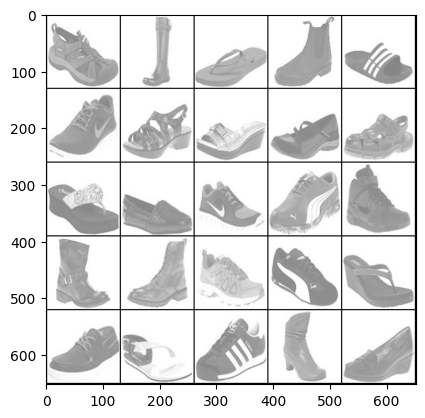

Epoch [223/500] Step 10500: Generator loss: 0.8501228049993521, Discriminator loss: 0.6597959600687022


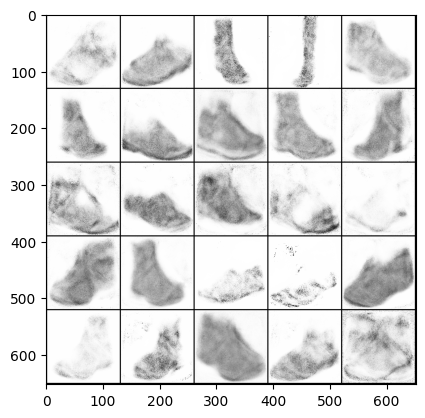

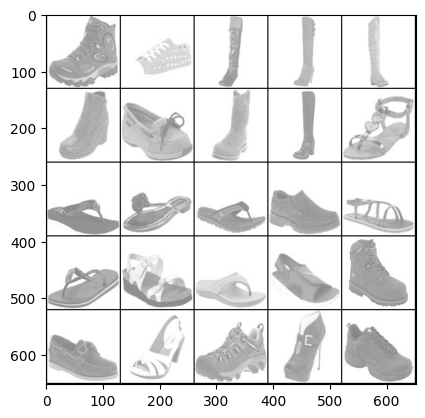

Epoch [234/500] Step 11000: Generator loss: 0.847781275629997, Discriminator loss: 0.6586992609500881


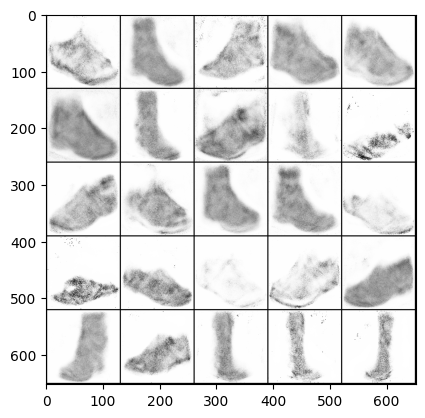

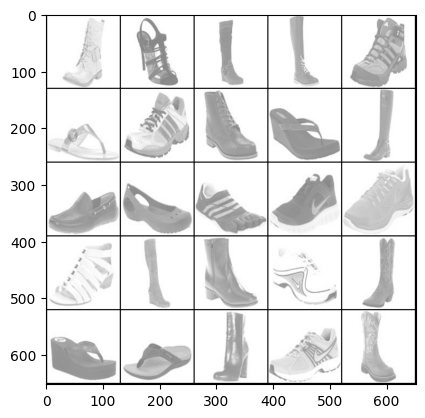

Epoch [244/500] Step 11500: Generator loss: 0.8473994835615156, Discriminator loss: 0.6596633560657502


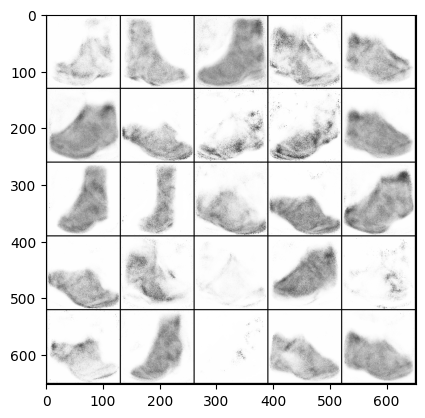

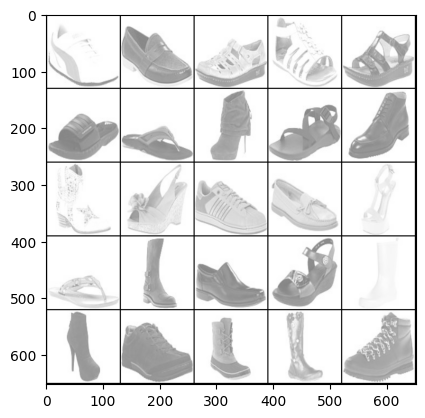

Epoch [255/500] Step 12000: Generator loss: 0.8509854731559764, Discriminator loss: 0.6593387212753298


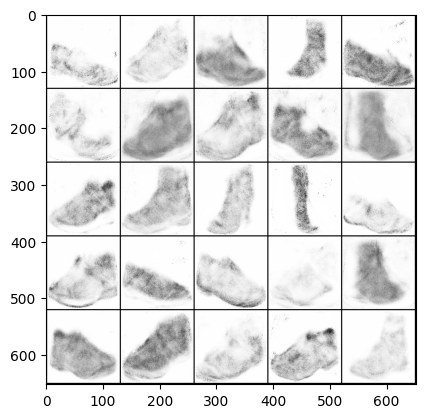

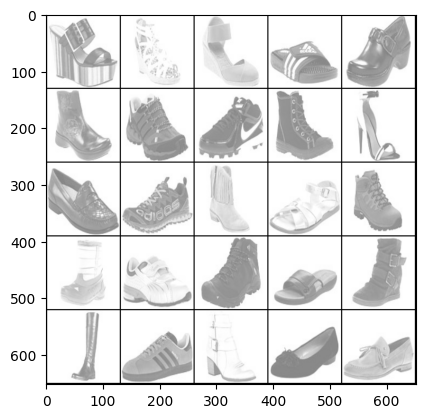

Epoch [265/500] Step 12500: Generator loss: 0.8513492232561115, Discriminator loss: 0.6558042955398564


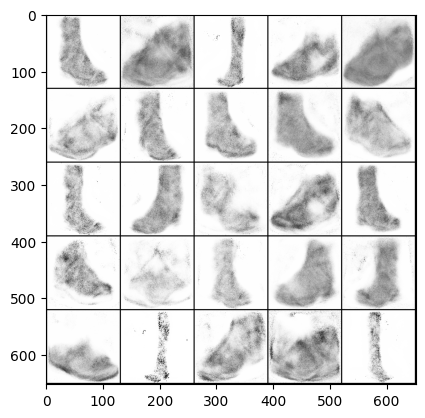

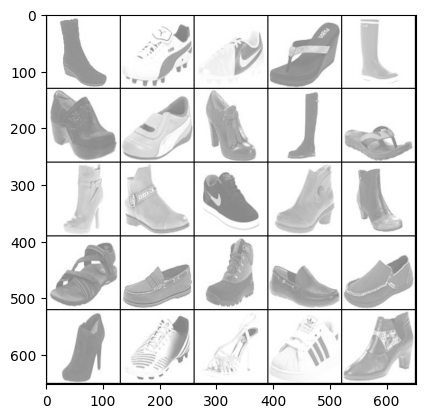

Epoch [276/500] Step 13000: Generator loss: 0.8528489596843718, Discriminator loss: 0.6558724725246431


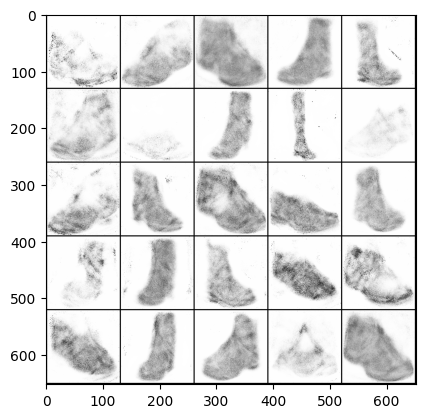

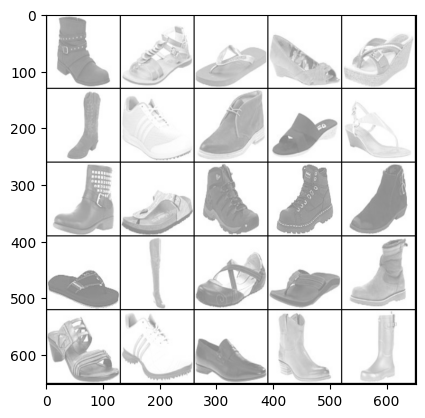

Epoch [287/500] Step 13500: Generator loss: 0.8532352107763289, Discriminator loss: 0.6544090406894681


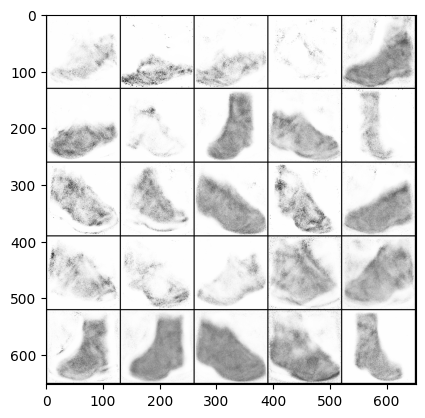

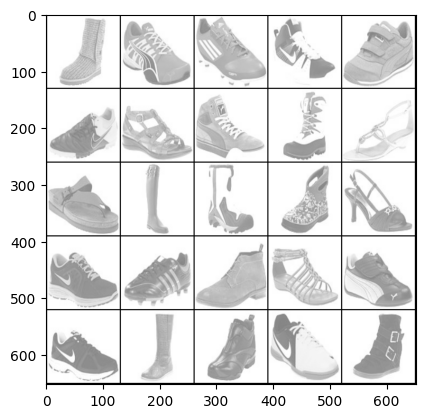

Epoch [297/500] Step 14000: Generator loss: 0.8561935924291608, Discriminator loss: 0.6537278158664707


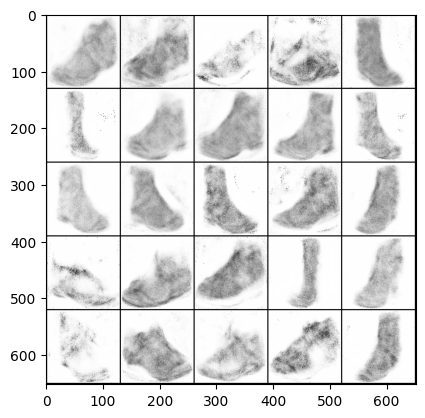

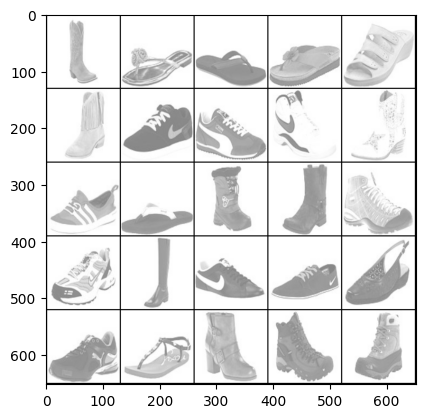

Epoch [308/500] Step 14500: Generator loss: 0.8684933456182478, Discriminator loss: 0.6502346193790434


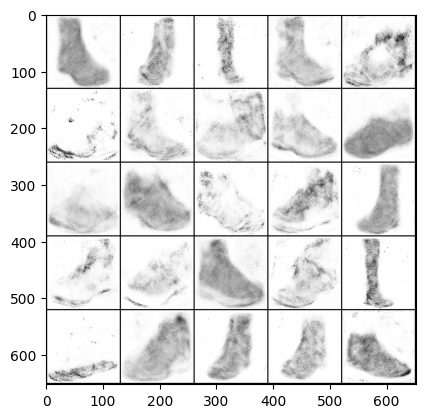

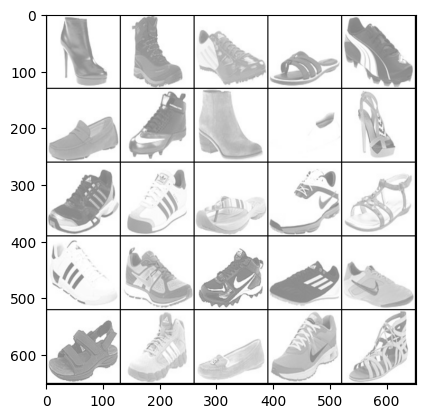

Epoch [319/500] Step 15000: Generator loss: 0.8700159976482383, Discriminator loss: 0.6484385207891468


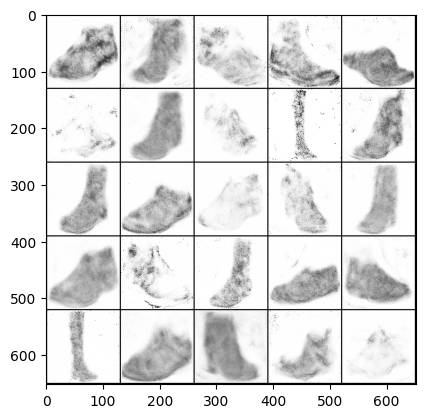

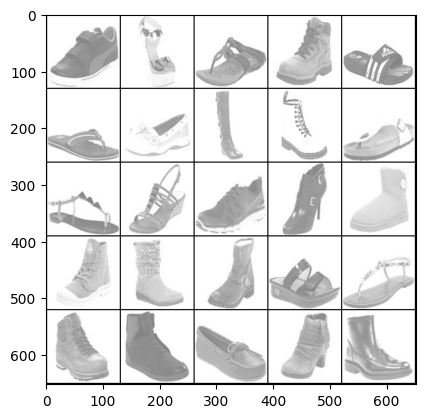

Epoch [329/500] Step 15500: Generator loss: 0.8775914795398716, Discriminator loss: 0.6448860652446742


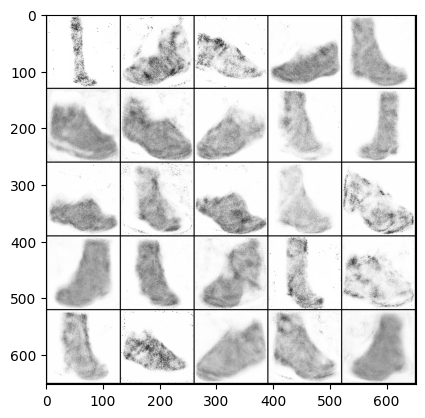

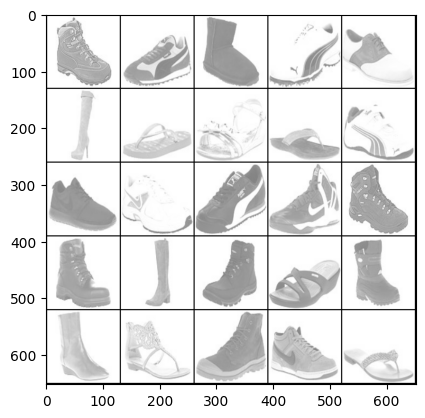

Epoch [340/500] Step 16000: Generator loss: 0.8817093213796618, Discriminator loss: 0.6430129925012587


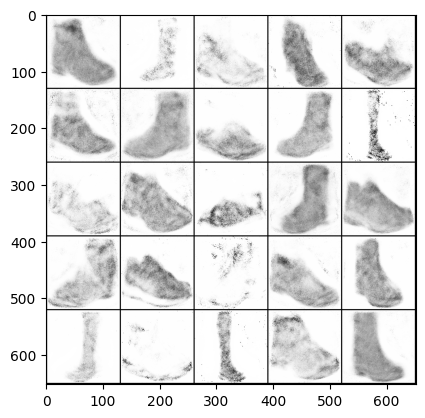

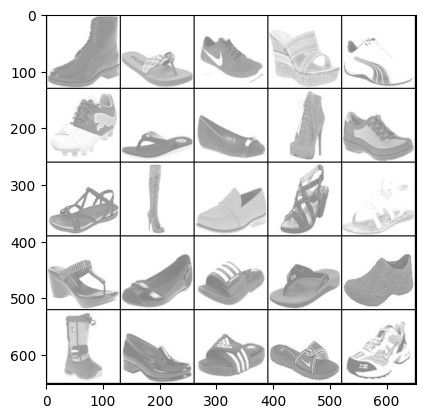

Epoch [351/500] Step 16500: Generator loss: 0.8929947537183756, Discriminator loss: 0.6399742189645765


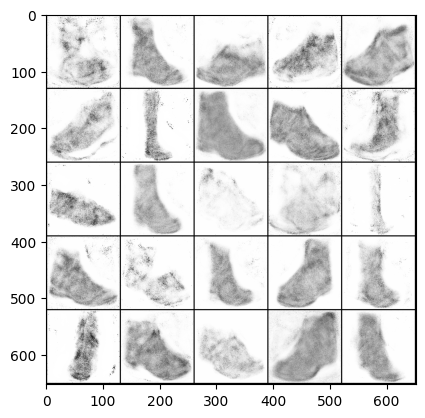

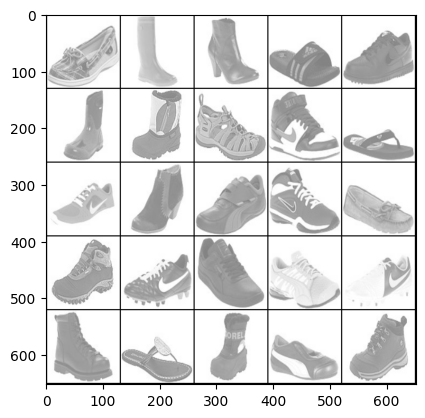

Epoch [361/500] Step 17000: Generator loss: 0.9000908591747281, Discriminator loss: 0.6350858992338181


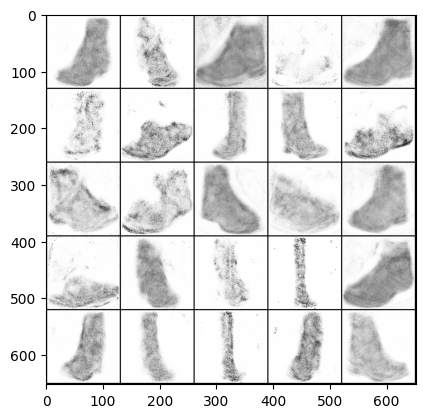

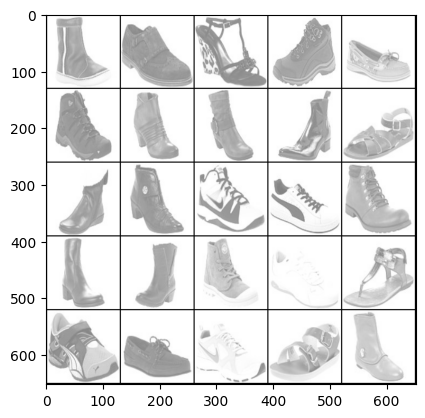

Epoch [372/500] Step 17500: Generator loss: 0.9089183018207541, Discriminator loss: 0.6311151850223539


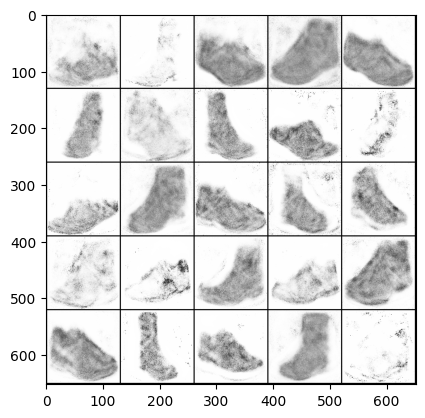

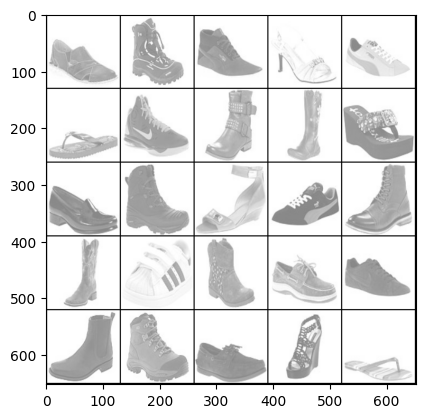

Epoch [382/500] Step 18000: Generator loss: 0.923238836288452, Discriminator loss: 0.627379129290581


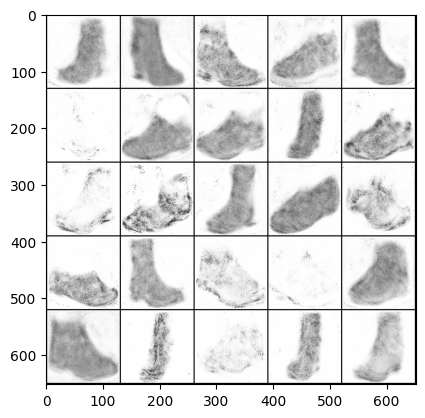

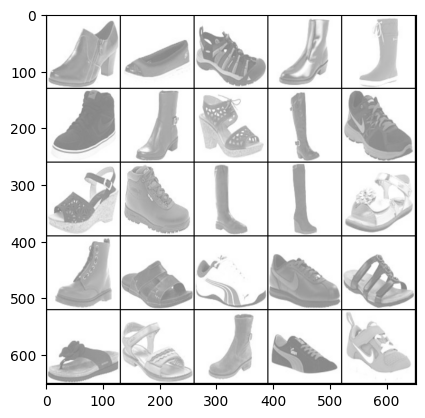

Epoch [393/500] Step 18500: Generator loss: 0.9359499713182446, Discriminator loss: 0.623492446422577


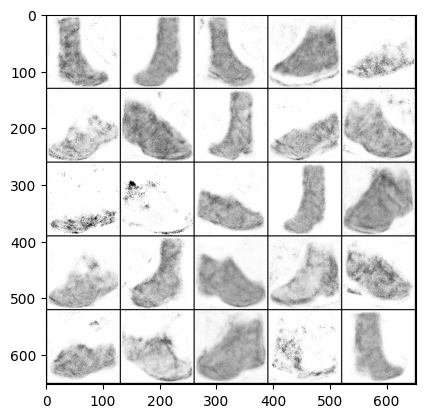

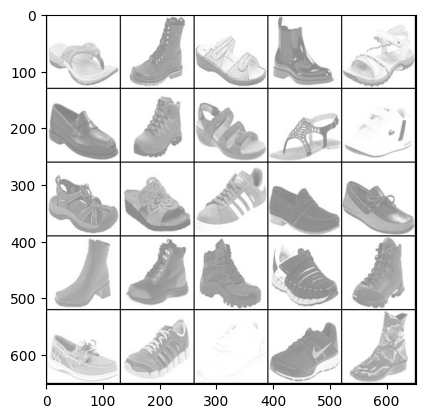

Epoch [404/500] Step 19000: Generator loss: 0.9469923827648157, Discriminator loss: 0.6173659691810608


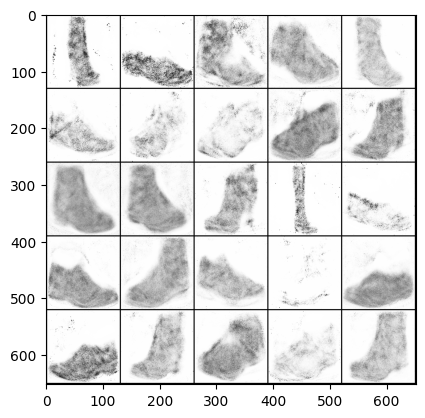

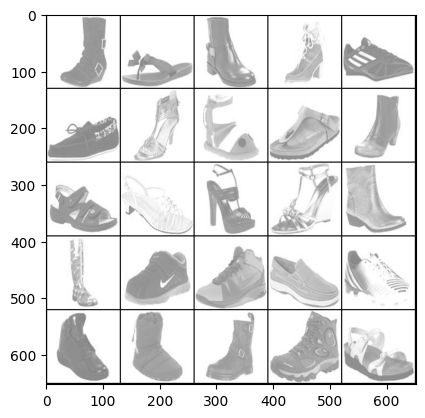

Epoch [414/500] Step 19500: Generator loss: 0.9556954406499866, Discriminator loss: 0.6122285828590391


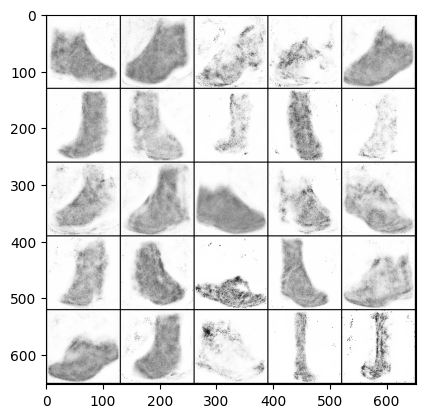

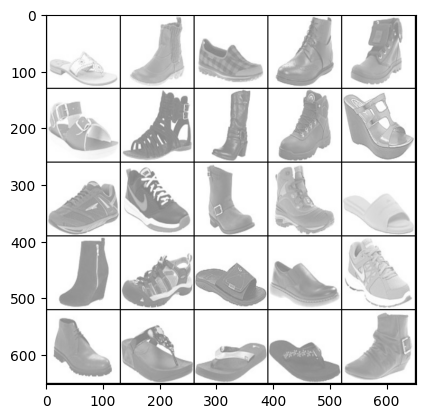

Epoch [425/500] Step 20000: Generator loss: 0.9718853218555442, Discriminator loss: 0.6077020486593243


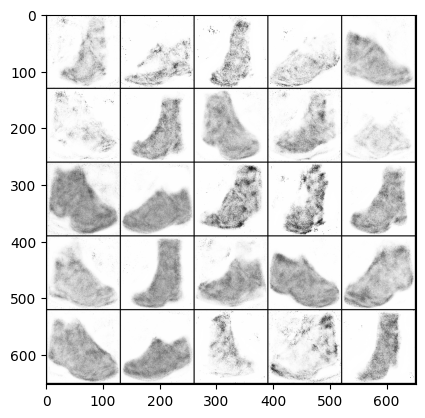

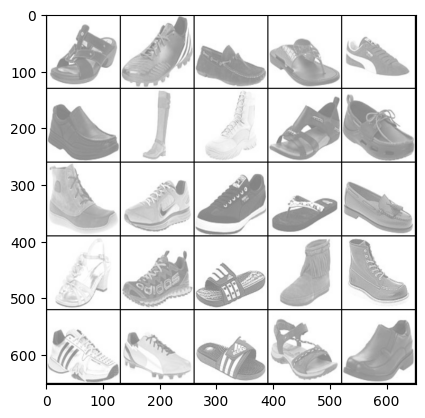

Epoch [436/500] Step 20500: Generator loss: 0.988181016564369, Discriminator loss: 0.6007276481389997


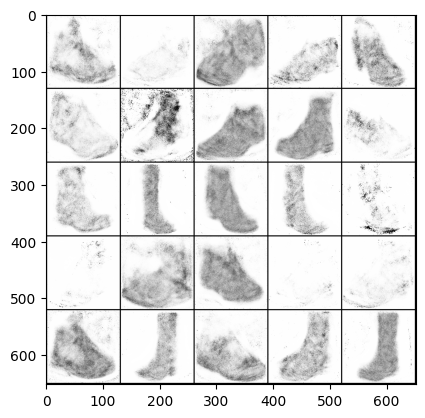

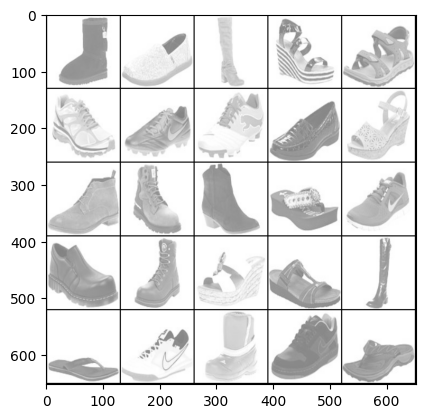

Epoch [446/500] Step 21000: Generator loss: 1.0055277477502818, Discriminator loss: 0.5939780496358871


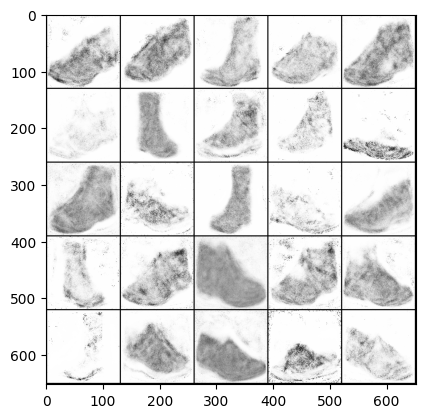

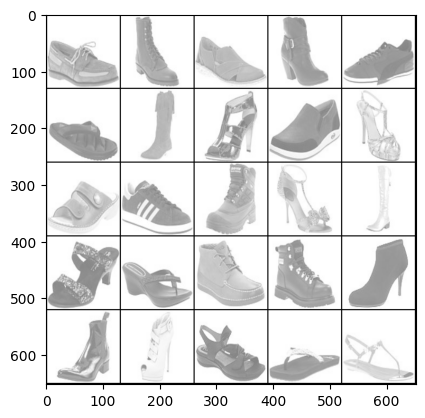

Epoch [457/500] Step 21500: Generator loss: 1.0234397503137584, Discriminator loss: 0.5874611589908602


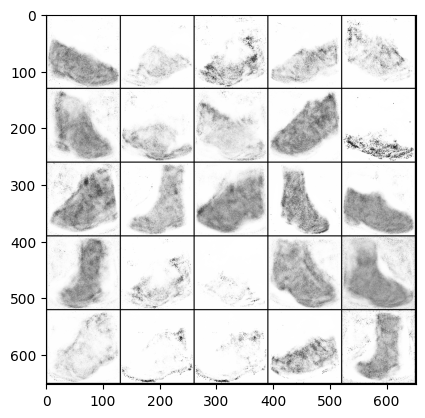

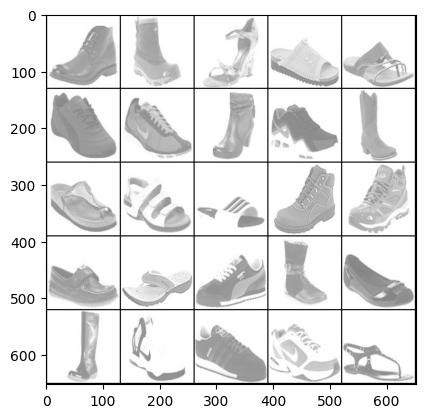

Epoch [468/500] Step 22000: Generator loss: 1.046072044134139, Discriminator loss: 0.5793197410106657


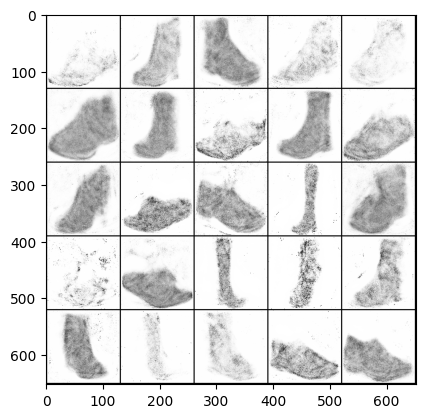

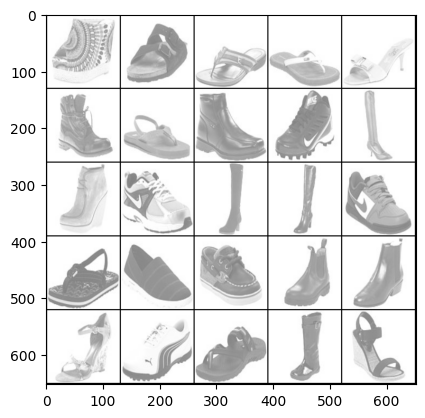

Epoch [478/500] Step 22500: Generator loss: 1.0661606332063678, Discriminator loss: 0.5717186609506604


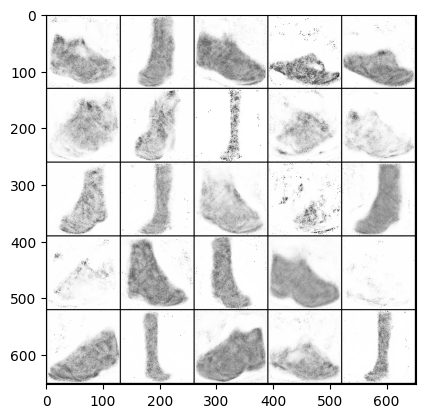

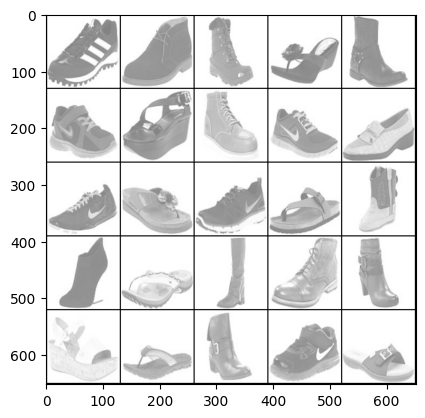

Epoch [489/500] Step 23000: Generator loss: 1.0905197808742533, Discriminator loss: 0.5645599362850184


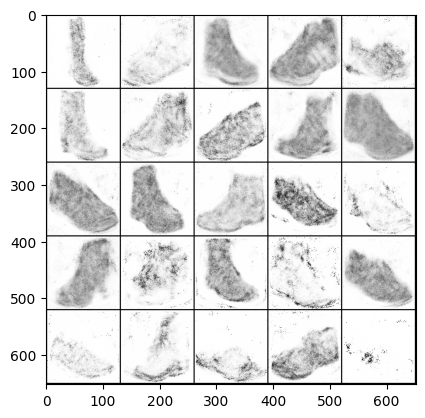

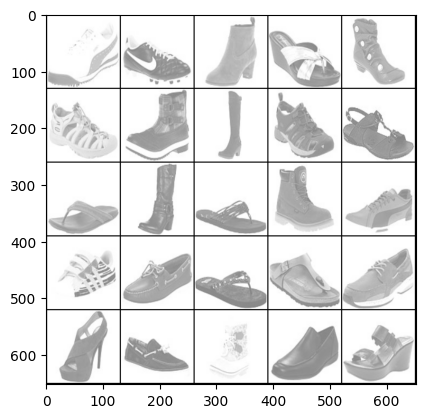

In [60]:
for epoch in range(n_epochs):
    for real, _ in train_loader:
        cur_batch_size = len(real)
        real = real.to(device)

        ### Update Discriminator ###
        disc_opt.zero_grad()
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        disc_loss.backward()
        
        # Apply gradient clipping to the discriminator
        torch.nn.utils.clip_grad_norm_(disc.parameters(), max_norm=1.0)
        disc_opt.step()

        ### Update Generator ###
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()

        # Apply gradient clipping to the generator
        torch.nn.utils.clip_grad_norm_(gen.parameters(), max_norm=1.0)
        gen_opt.step()

        ### Logging ###
        mean_discriminator_loss += disc_loss.item() / display_step
        mean_generator_loss += gen_loss.item() / display_step

        ### Visual Feedback and Logging ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch [{epoch}/{n_epochs}] Step {cur_step}: Generator loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}")
            with torch.no_grad():  # Temporarily set all the requires_grad flag to false
                gen.eval()
                fake_noise = get_noise(cur_batch_size, z_dim, device=device)
                fake = gen(fake_noise)
                show_tensor_images(fake)
                show_tensor_images(real)
                gen.train()
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        
        cur_step += 1


In [ ]:
# Save the model
#torch.save(gen.state_dict(), 'gen_1000_epochs.pth')
#torch.save(disc.state_dict(), 'disc_1000_epochs.pth')

In [ ]:
# Save model checkpoints periodically or based on performance
#torch.save(disc.state_dict(), 'disc_750_epochs.pth')
#torch.save(gen.state_dict(), 'gen_750_epochs.pth')